In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training')
mask_dir = base_dir.joinpath('masks_img')
image_dir = base_dir.joinpath('img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
trees_dir = mask_dir.joinpath('tree')
low_dir = mask_dir.joinpath('low')

In [3]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [62]:
def make_path_tile(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}{number}.tif")

In [4]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [5]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [6]:
def load_stack(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image(image_path)
    return stack

def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [7]:
I = 200
N = 256
M = 256
V = 4

In [8]:
train_images = load_stack((I, N, M), np.float32, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, 1)

In [9]:
train_images_R.shape

(200, 256, 256, 1)

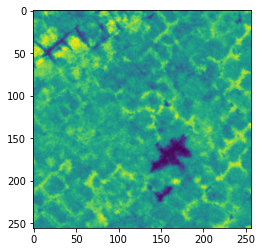

In [10]:
plt.imshow(train_images[1, :,:])

In [11]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
trees_mask = load_stack_safely((I, N, M), np.int8, trees_dir, "tree")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")
low_mask = load_stack_safely((I, N, M), np.int8, low_dir, "low")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_2.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_9.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_15.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_23.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_24.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_26.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_30.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/water/water_36.tif
skipping /media/hkropp/research/Kolyma_D

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_51.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_52.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_53.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_55.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_56.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_57.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_58.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_59.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/tree/tree_60.tif
skipping /media/hkropp/research/Kolyma_Data/training/Ko

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_126.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_127.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_129.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_130.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_131.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_132.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_134.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_135.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training/masks_img/shrub/shrub_136.tif
skipping /media/hkropp/resea

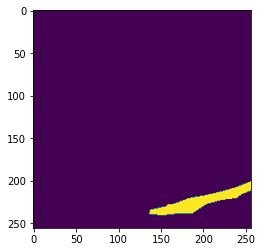

In [12]:
plt.imshow(low_mask[53, :,:])

In [175]:
water_mask[183,:,:]

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=int8)

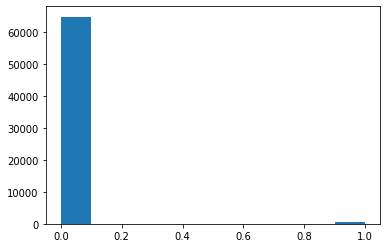

In [13]:
plt.hist(water_mask[0, :,:].flatten())
plt.show()

In [16]:
# divide data
W = 175
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, 1), dtype =np.float32)

Y[0:174, :, :, 0] = trees_mask[0:174, :, :]
Y[0:174, :, :, 1] = water_mask[0:174, :, :]
Y[0:174, :, :, 2] = shrubs_mask[0:174, :, :]
Y[0:174, :, :, 3] = low_mask[0:174, :, :]
Y_train_img[0:174, :, :, 0] = train_images_R[0:174, :, :, 0]


K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, 1), dtype =np.float32)

Y_valid[0:25, :, :, 0] = trees_mask[175:200, :, :]
Y_valid[0:25, :, :, 1] = water_mask[175:200, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[175:200, :, :]
Y_valid[0:25, :, :, 3] = low_mask[175:200, :, :]
Y_valid_img[0:25, :, :, 0] = train_images_R[175:200, :, :, 0]

In [17]:
model = satellite_unet((N, M, 1), V)

In [18]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [19]:
history = model.fit(Y_train_img, Y, epochs = 200)

Epoch 1/200
6/6 [==============================] - 30s 4s/step - loss: 0.5147 - iou: 0.2108 - iou_thresholded: 0.3168
Epoch 2/200
6/6 [==============================] - 23s 4s/step - loss: 0.1994 - iou: 0.4162 - iou_thresholded: 0.5422
Epoch 3/200
6/6 [==============================] - 23s 4s/step - loss: 0.1525 - iou: 0.5220 - iou_thresholded: 0.6223
Epoch 4/200
6/6 [==============================] - 23s 4s/step - loss: 0.1460 - iou: 0.5235 - iou_thresholded: 0.6131
Epoch 5/200
6/6 [==============================] - 23s 4s/step - loss: 0.1269 - iou: 0.5684 - iou_thresholded: 0.6737
Epoch 6/200
6/6 [==============================] - 23s 4s/step - loss: 0.1333 - iou: 0.5672 - iou_thresholded: 0.6565
Epoch 7/200
6/6 [==============================] - 23s 4s/step - loss: 0.1596 - iou: 0.5316 - iou_thresholded: 0.5982
Epoch 8/200
6/6 [==============================] - 23s 4s/step - loss: 0.1408 - iou: 0.5028 - iou_thresholded: 0.6063
Epoch 9/200
6/6 [==============================] - 23s 4

6/6 [==============================] - 23s 4s/step - loss: 0.0550 - iou: 0.7588 - iou_thresholded: 0.8357
Epoch 70/200
6/6 [==============================] - 23s 4s/step - loss: 0.0521 - iou: 0.7901 - iou_thresholded: 0.8570
Epoch 71/200
6/6 [==============================] - 23s 4s/step - loss: 0.0560 - iou: 0.7813 - iou_thresholded: 0.8395
Epoch 72/200
6/6 [==============================] - 23s 4s/step - loss: 0.0612 - iou: 0.7578 - iou_thresholded: 0.8066
Epoch 73/200
6/6 [==============================] - 23s 4s/step - loss: 0.0596 - iou: 0.7567 - iou_thresholded: 0.8334
Epoch 74/200
6/6 [==============================] - 23s 4s/step - loss: 0.0581 - iou: 0.7585 - iou_thresholded: 0.8177
Epoch 75/200
6/6 [==============================] - 23s 4s/step - loss: 0.0561 - iou: 0.7730 - iou_thresholded: 0.8381
Epoch 76/200
6/6 [==============================] - 24s 4s/step - loss: 0.0698 - iou: 0.7443 - iou_thresholded: 0.8107
Epoch 77/200
6/6 [==============================] - 27s 5s/st

6/6 [==============================] - 40s 7s/step - loss: 0.0432 - iou: 0.8210 - iou_thresholded: 0.8711
Epoch 138/200
6/6 [==============================] - 41s 7s/step - loss: 0.0404 - iou: 0.8240 - iou_thresholded: 0.8769
Epoch 139/200
6/6 [==============================] - 41s 7s/step - loss: 0.0392 - iou: 0.8282 - iou_thresholded: 0.8870
Epoch 140/200
6/6 [==============================] - 39s 6s/step - loss: 0.0448 - iou: 0.8322 - iou_thresholded: 0.8788
Epoch 141/200
6/6 [==============================] - 39s 6s/step - loss: 0.0393 - iou: 0.8411 - iou_thresholded: 0.8852
Epoch 142/200
6/6 [==============================] - 39s 6s/step - loss: 0.0403 - iou: 0.8141 - iou_thresholded: 0.8648
Epoch 143/200
6/6 [==============================] - 40s 7s/step - loss: 0.0401 - iou: 0.8290 - iou_thresholded: 0.8820
Epoch 144/200
6/6 [==============================] - 40s 7s/step - loss: 0.0474 - iou: 0.8257 - iou_thresholded: 0.8697
Epoch 145/200
6/6 [==============================] - 3

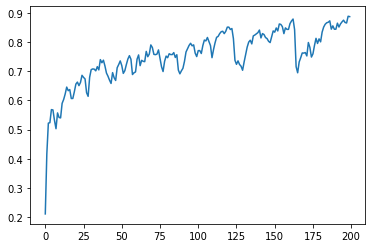

In [26]:
plt.plot(history.history['iou'])

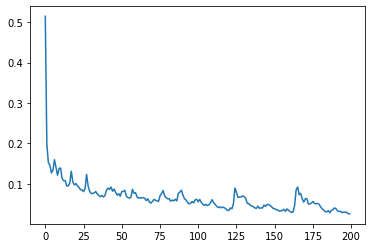

In [27]:
plt.plot(history.history['loss'])

In [22]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/model/1971')

In [23]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971/assets


INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971/assets


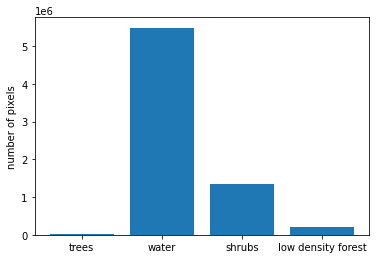

In [24]:
fig, ax = plt.subplots()
ax.bar(range(V), [trees_mask.sum(), water_mask.sum(), shrubs_mask.sum(), low_mask.sum()])
ax.set_xticks((0, 1, 2, 3))
ax.set_xticklabels(('trees', 'water', 'shrubs', 'low density forest'))
plt.ylabel('number of pixels')
plt.show()

In [25]:
Y_pred = model.predict(Y_train_img)

6/6 [==============================] - 14s 2s/step


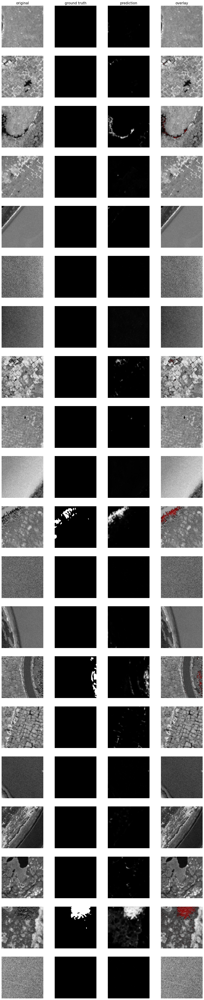

In [28]:
from keras_unet.utils import plot_imgs

# Trees
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

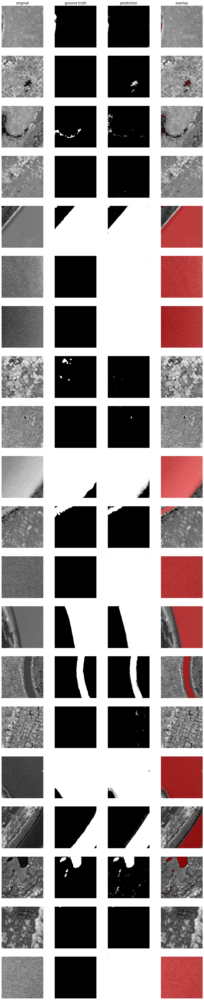

In [30]:
# Water
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

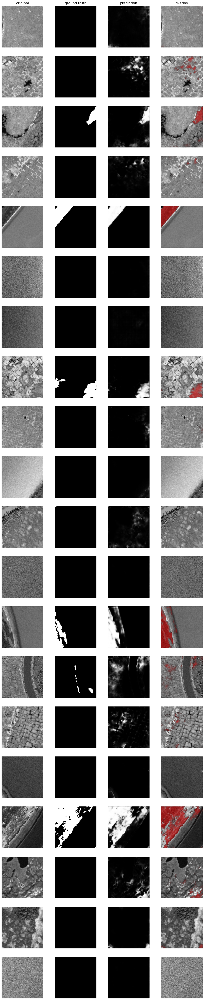

In [31]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

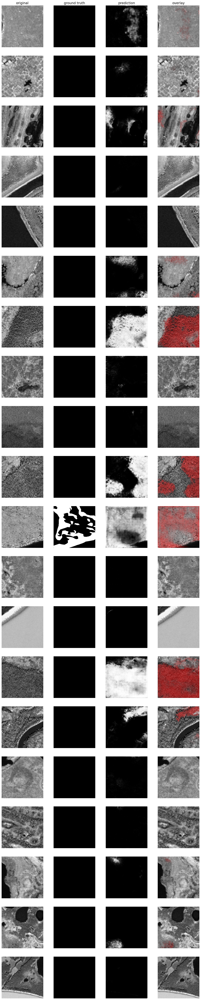

In [36]:
# Low density forest
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 3], 
    pred_imgs=Y_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [32]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 1s 1s/step


In [33]:
valid_pred[1,:, :, 0]

array([[3.3352224e-04, 2.3522734e-06, 3.9677657e-06, ..., 1.3104194e-05,
        3.0976262e-05, 6.6426161e-05],
       [6.1496695e-07, 4.2927684e-07, 1.8850256e-08, ..., 9.2594821e-09,
        4.9789293e-07, 1.1708827e-05],
       [2.7161543e-06, 1.3543986e-06, 2.9274509e-07, ..., 4.4150471e-07,
        4.1265384e-06, 1.6358537e-05],
       ...,
       [2.2839670e-06, 5.0437711e-06, 3.2424015e-07, ..., 1.6908095e-03,
        1.6455279e-03, 1.7166695e-03],
       [7.4500567e-06, 1.4068050e-07, 2.6234259e-08, ..., 4.0345606e-03,
        4.3876017e-03, 1.7527999e-02],
       [5.3681131e-04, 2.2846139e-05, 4.1017668e-07, ..., 2.9071677e-03,
        4.2479839e-03, 1.2438344e-02]], dtype=float32)

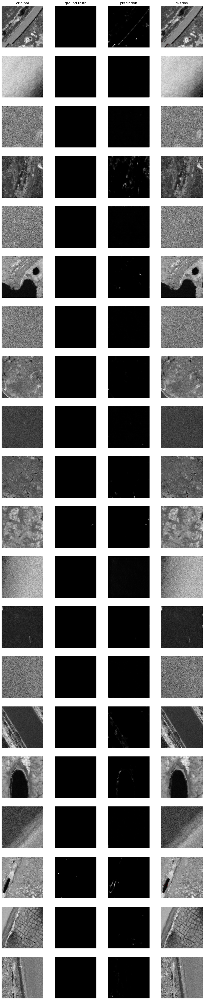

In [34]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

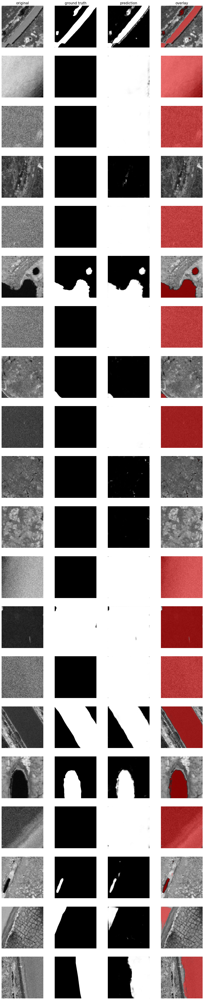

In [35]:
# Water
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [36]:
waterPredict = valid_pred[:,:,:,1]

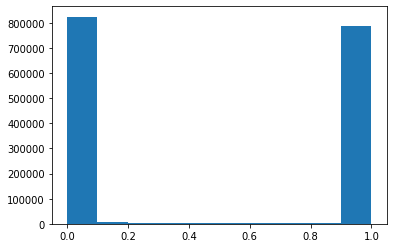

In [37]:
plt.hist(waterPredict.flatten())
plt.show()

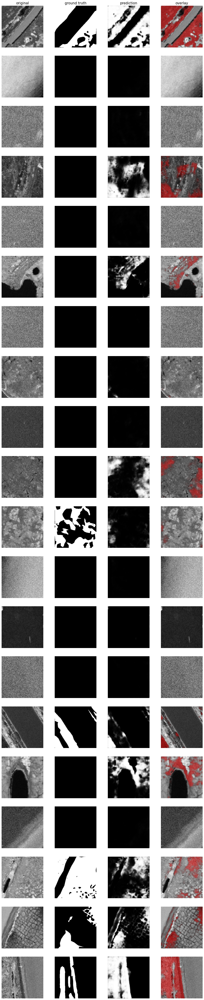

In [38]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

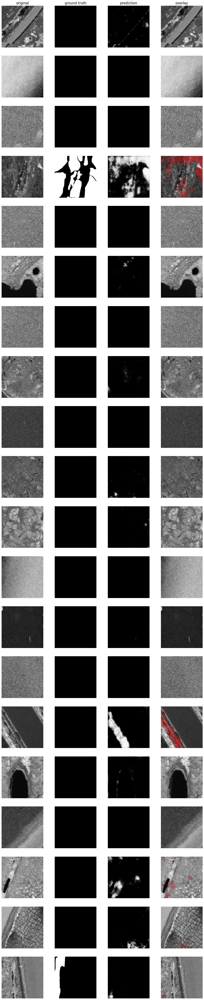

In [39]:
# Low density forest
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 3], 
    pred_imgs=valid_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [40]:
Y_valid[0,0,0,0]

0

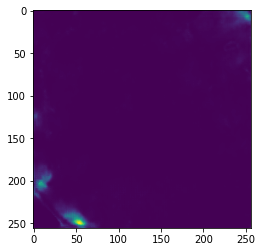

In [42]:
plt.imshow(valid_pred[7,:, :,2])

In [43]:
driver = gdal.GetDriverByName("GTiff")

In [44]:
driver.Register()

2

In [176]:
def save_predict_validT( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [177]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971/tree'
save_predict_validT(nImg = 25,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = image_dir , prefix_orig = "img")

In [178]:
def save_predict_validW( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,1])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [179]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971/water'
save_predict_validW(nImg = 25,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = image_dir , prefix_orig = "img")

In [180]:
def save_predict_validS( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,2])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [181]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971/shrub'
save_predict_validS(nImg = 25,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = image_dir , prefix_orig = "img")

In [182]:
def save_predict_validL( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,3])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [183]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971/low'
save_predict_validL(nImg = 25,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = image_dir , prefix_orig = "img")

In [57]:
base_dirP = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256')

In [58]:
tiles = os.listdir(base_dirP)

In [59]:
T = len(tiles)

In [123]:
# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img1.tif')

In [124]:
for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [128]:
imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [131]:
imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [160]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [161]:
predict_img = load_stack_tiles((T, N, M), np.float32,base_dirP, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img552.tif
nullified /media/hkropp/research/Kolyma_Da

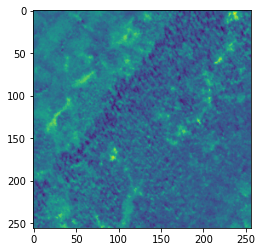

In [156]:
plt.imshow(predict_img[1000,:,:])

In [162]:
predict_img[3000,:,:]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [163]:
Y_all = model.predict(predict_img.reshape(T, N, M, 1))

95/95 [==============================] - 144s 2s/step


In [166]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [167]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971/tree'
save_predict_tree(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP , prefix_orig = "img")

In [168]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [169]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971/water'
save_predict_water(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [170]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [171]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971/shrub'
save_predict_shrub(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [172]:
def save_predict_lowD( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [174]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971/low'
save_predict_lowD(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP , prefix_orig = "img")